# keypoints

In [1]:
import tensorflow as tf
from keras import backend as K
from keras.preprocessing import image
import matplotlib.pyplot as plt 
from keras.applications.resnet50 import preprocess_input, decode_predictions
import numpy as np

import keras

from keras.utils import np_utils
from keras.optimizers import Adam

import os
import numpy as np
import itertools

import cv2
import os
%matplotlib inline


Using TensorFlow backend.


In [2]:
img = []
for i in range(1, 4):
    path = 'images/Brandenburg' + str(i) + '.jpg'
    img.append(cv2.imread(path))

In [3]:
def plot3(img):
    fig=plt.figure(figsize=(20, 10))
    columns = 3
    rows = 1
    for i in range(1,4):
        image = img[i-1]
        fig.add_subplot(rows, columns, i)
        plt.imshow(image)
        plt.axis('off')
        plt.tight_layout()
    plt.show()

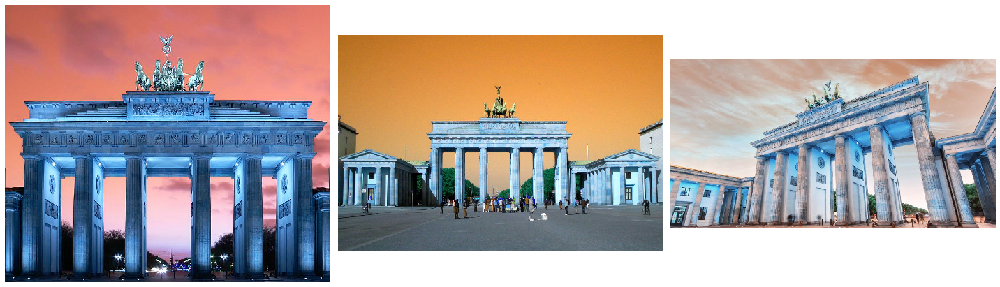

In [4]:
plot3(img)

In [7]:
DETECTOR_METHOD_FAST = "fast"
DETECTOR_METHOD_SIFT = "sift"
DETECTOR_METHOD_HARRIS = "harris"

DESCRIPTOR_METHOD_BRIEF = "brief"
DESCRIPTOR_METHOD_SIFT = "sift"

def get_image_description(img, threshold = 75, 
                          detector = DETECTOR_METHOD_FAST, 
                          descriptor = DESCRIPTOR_METHOD_SIFT,
                          drawDebug = False):
    img_array = image.img_to_array(img)
    img_grayscale = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY).astype(np.uint8)
    
    if detector == DETECTOR_METHOD_HARRIS:
        keypoints = []
        responses = cv2.cornerHarris(img_grayscale, 2, 3, 0.04)
        for x in (-responses.flatten()).argsort()[:threshold]:
            indices = np.unravel_index(x, responses.shape)
            keypoints.append(cv2.KeyPoint(indices[1], indices[0], 17))
    elif detector == DETECTOR_METHOD_SIFT:
        feat = cv2.xfeatures2d.SIFT_create(threshold)
        keypoints = feat.detect(img_grayscale, None)
    elif detector == DETECTOR_METHOD_FAST:
        feat = cv2.FastFeatureDetector_create(threshold)
        keypoints = feat.detect(img_grayscale, None)
    else:
        raise Exception("Unknown detector")

    if drawDebug:
        img_array_kp = img_array.copy().astype(np.uint8)
        cv2.drawKeypoints(img_array_kp, keypoints, img_array_kp, (0, 255, 0))
        plt.axis('off')
        plt.imshow(img_array_kp)
        plt.title(detector)
        plt.show()
    
    if descriptor == DESCRIPTOR_METHOD_SIFT:
        descriptor = cv2.xfeatures2d.SIFT_create()
    else:
        descriptor = cv2.xfeatures2d.BriefDescriptorExtractor_create()
    return img_array, descriptor.compute(img_grayscale, keypoints)

def keypoint_match(pic, pattern, pic_desc, pattern_desc, drawDebug = False):
    bf = cv2.BFMatcher()
    matches = bf.match(pattern_desc[1], pic_desc[1])
    
    if drawDebug:
        plt.figure(figsize=(20, 20))
        plt.axis('off')
        plt.imshow(cv2.drawMatches(pattern, pattern_desc[0], pic, pic_desc[0], matches, 0,
                                   flags=0, matchColor=(0, 255, 0), singlePointColor=(255, 0, 0)).astype(np.uint8))
        plt.show()
    return matches

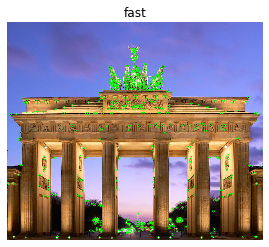

In [8]:
pic1, pic_desc1 = get_image_description(image.load_img("images/Brandenburg1.jpg"), drawDebug = True)

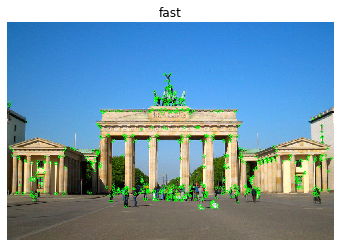

In [9]:
pic2, pic_desc2 = get_image_description(image.load_img("images/Brandenburg2.jpg"), drawDebug = True)

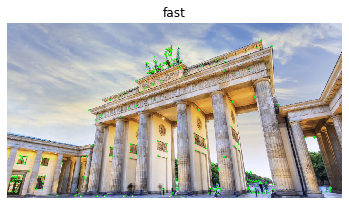

In [10]:
pic3, pic_desc3 = get_image_description(image.load_img("images/Brandenburg3.jpg"), drawDebug = True)

In [17]:
#matches = keypoint_match(pic1, pic2, pic_desc1, pic_desc2, True)

In [16]:
#matches = keypoint_match(pic1, pic3, pic_desc1, pic_desc3, True)

In [15]:
#matches = keypoint_match(pic2, pic3, pic_desc2, pic_desc3, True)

In [112]:
for descriptor in [DESCRIPTOR_METHOD_SIFT, DESCRIPTOR_METHOD_BRIEF]:
    pattern, pattern_desc = get_image_description(
        image.load_img("images/Brandenburg1.jpg"), 5, detector=DETECTOR_METHOD_FAST, descriptor = descriptor)

    pic, pic_desc = get_image_description(
        image.load_img("images/Brandenburg2.jpg"), 5, detector=DETECTOR_METHOD_FAST, descriptor = descriptor)
    # matches = keypoint_match(pic.astype(np.uint8), pattern_with_kp.astype(np.uint8), pic_desc, pattern_desc, True)
    # matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True)

In [113]:
descriptor = cv2.xfeatures2d.BriefDescriptorExtractor_create()

In [12]:
#pattern, pattern_desc = get_image_description(image.load_img("images/Brandenburg1.jpg"), threshold=1000, detector=DETECTOR_METHOD_HARRIS, drawDebug=True)

In [13]:
#pattern, pattern_desc = get_image_description(image.load_img("images/Brandenburg1.jpg"), threshold=1000, detector=DETECTOR_METHOD_SIFT, drawDebug=True)

In [14]:
#pattern, pattern_desc = get_image_description(image.load_img("images/Brandenburg1.jpg"), threshold=60, detector=DETECTOR_METHOD_FAST, drawDebug=True)

harris


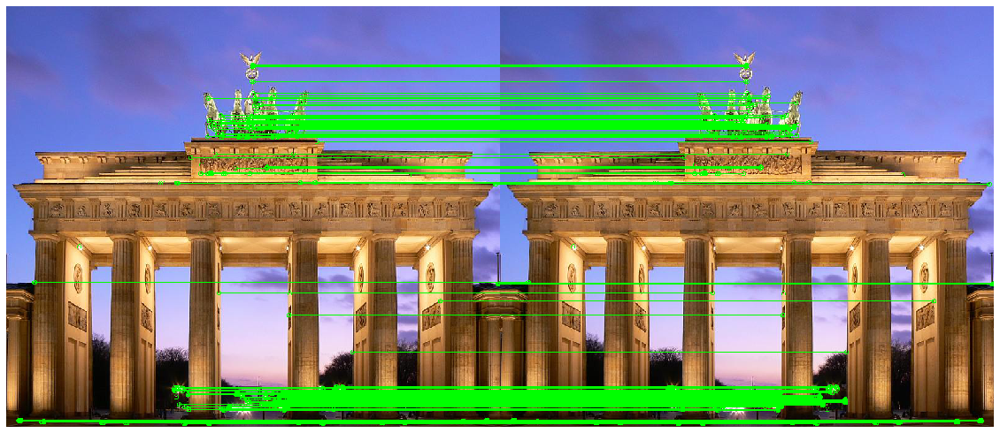

harris


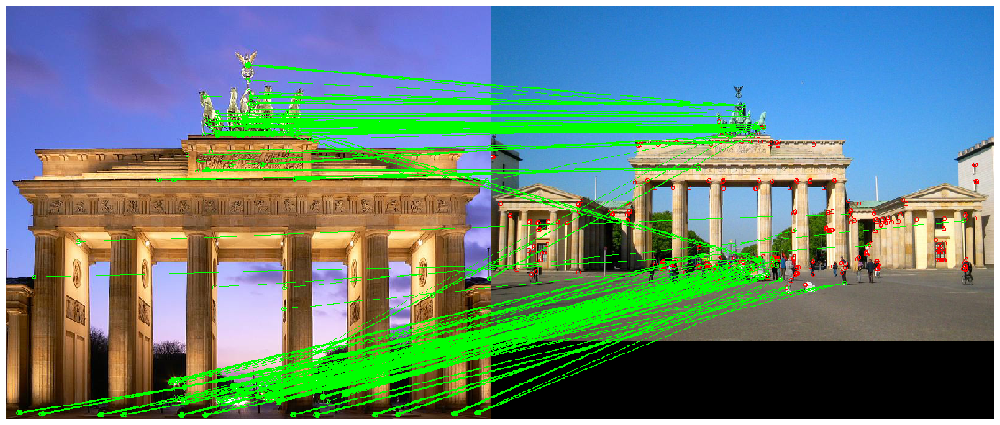

harris


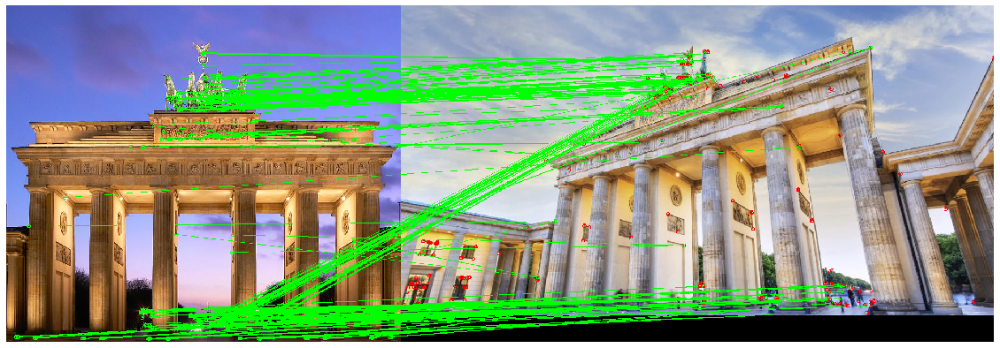

fast


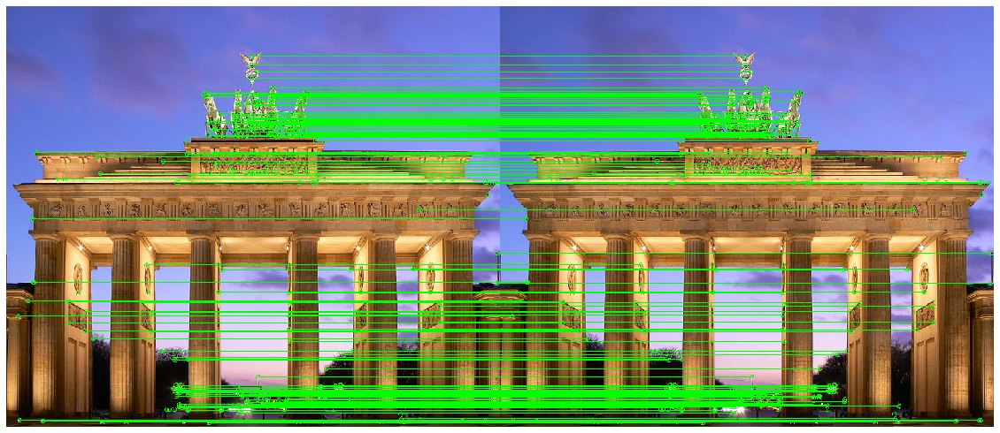

fast


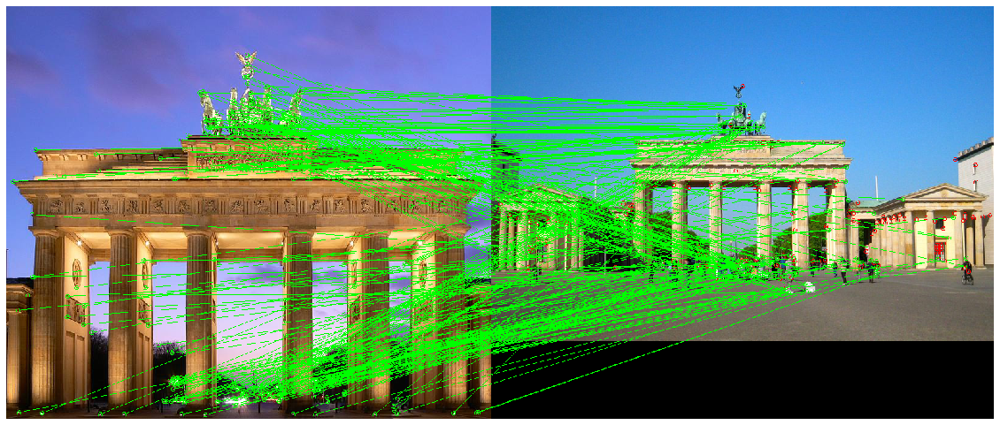

fast


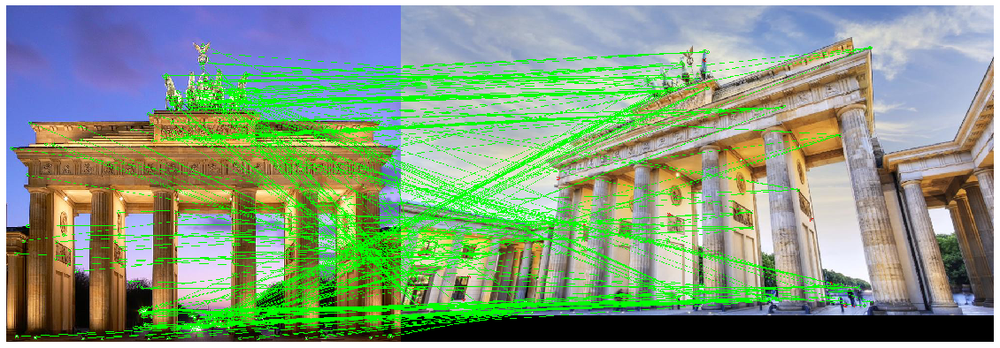

sift


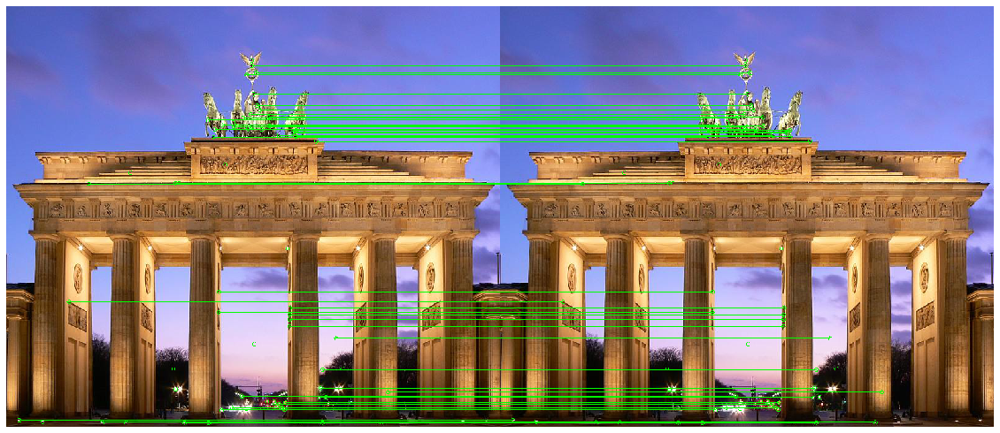

sift


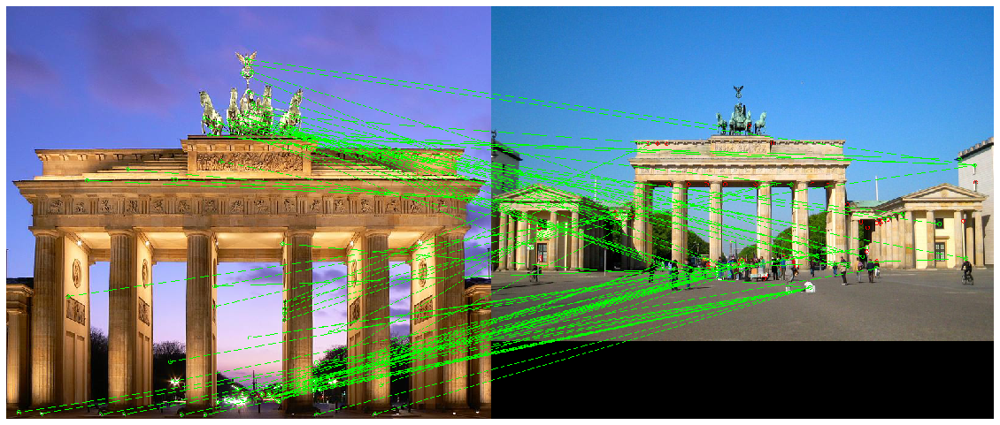

sift


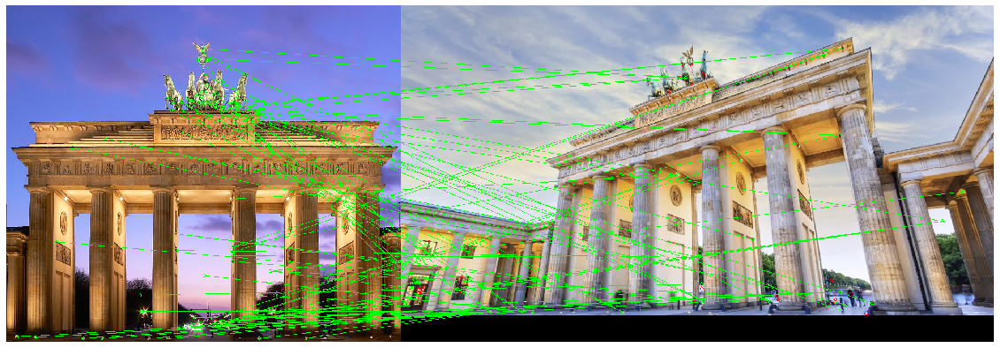

In [21]:
for detector, t_pattern, t_img in [(DETECTOR_METHOD_HARRIS, 500, 500), (DETECTOR_METHOD_FAST, 100, 100), (DETECTOR_METHOD_SIFT, 100, 100)]:
    for img in ["images/Brandenburg1.jpg", "images/Brandenburg2.jpg", "images/Brandenburg3.jpg"]:
        print(detector)
        pattern, pattern_desc = get_image_description(image.load_img("images/Brandenburg1.jpg"), t_pattern, detector=detector, drawDebug=False)
        pic, pic_desc = get_image_description(image.load_img(img), t_img, detector=detector)
        matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True)
        plt.show()

# face

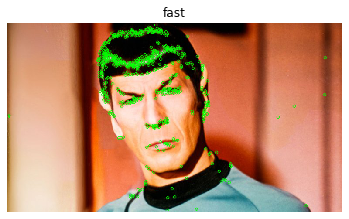

In [22]:
pic1, pic_desc1 = get_image_description(image.load_img("images/spock1.jpg"), 
                                        threshold=20, 
                                        detector = DETECTOR_METHOD_FAST, 
                                        descriptor = DESCRIPTOR_METHOD_SIFT,
                                        drawDebug = True)


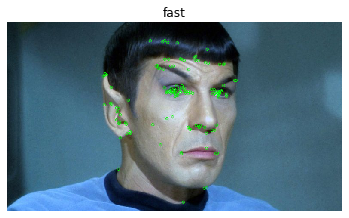

In [23]:
pic2, pic_desc2 = get_image_description(image.load_img("images/spock2.jpg"), 
                                        threshold=20, 
                                        detector = DETECTOR_METHOD_FAST, 
                                        descriptor = DESCRIPTOR_METHOD_SIFT,
                                        drawDebug = True)


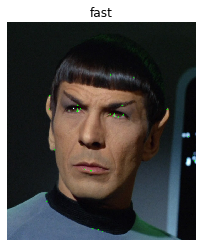

In [31]:
pic3, pic_desc3 = get_image_description(image.load_img("images/spock3.jpg"), 
                                        threshold=20, 
                                        detector = DETECTOR_METHOD_FAST, 
                                        descriptor = DESCRIPTOR_METHOD_SIFT,
                                        drawDebug = True)


In [32]:
#matches = keypoint_match(pic1, pic2, pic_desc1, pic_desc2, True)

In [33]:
#matches = keypoint_match(pic1, pic3, pic_desc1, pic_desc3, True)

In [34]:
#matches = keypoint_match(pic2, pic3, pic_desc2, pic_desc3, True)

harris


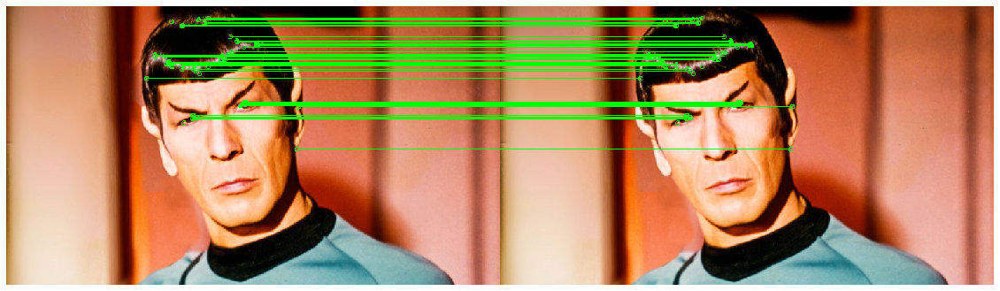

harris


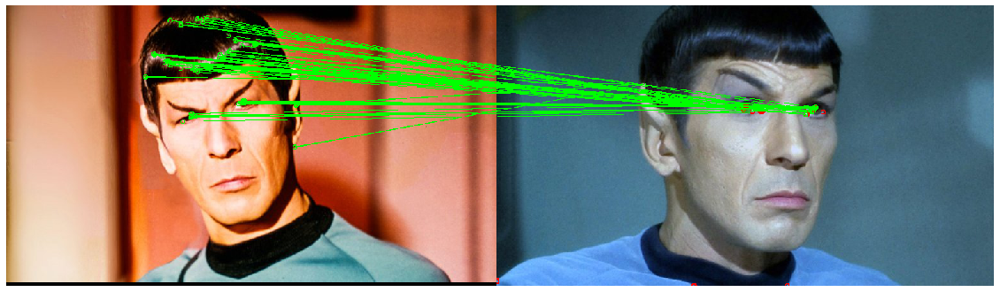

harris


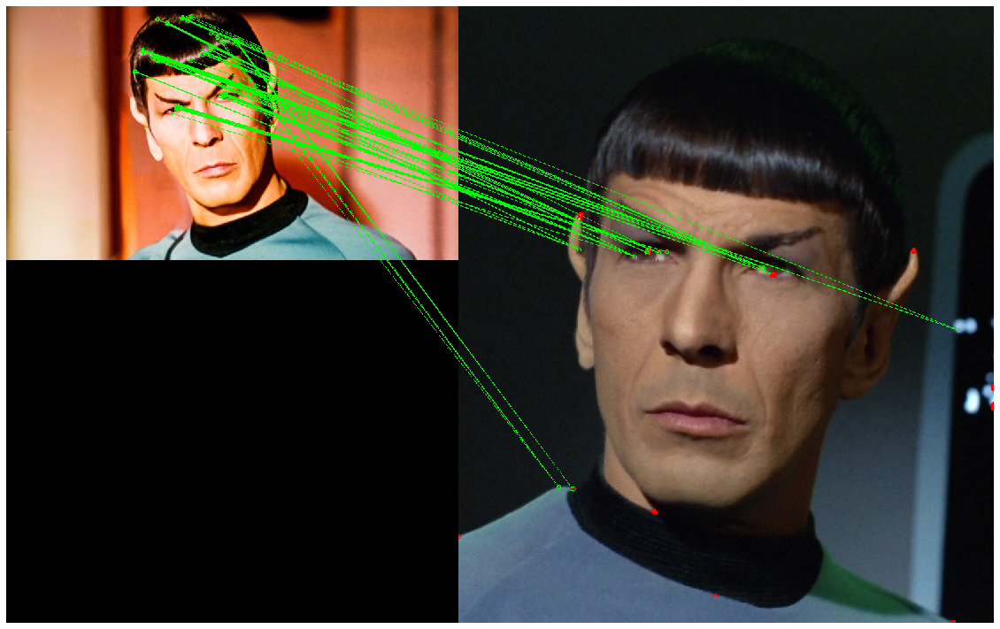

fast


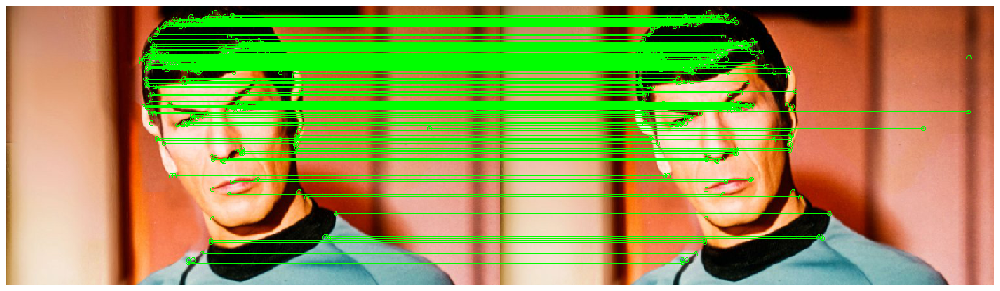

fast


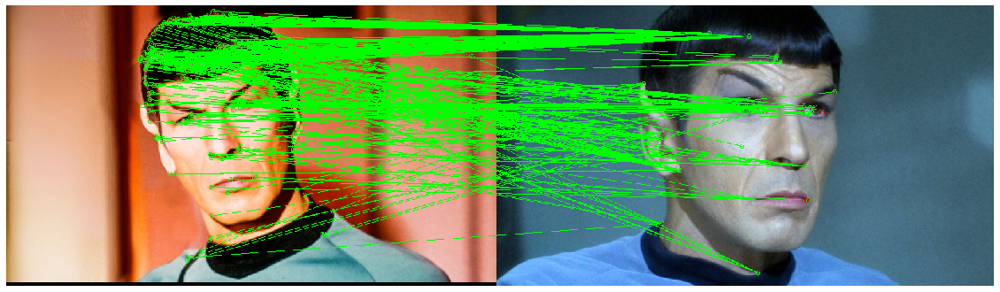

fast


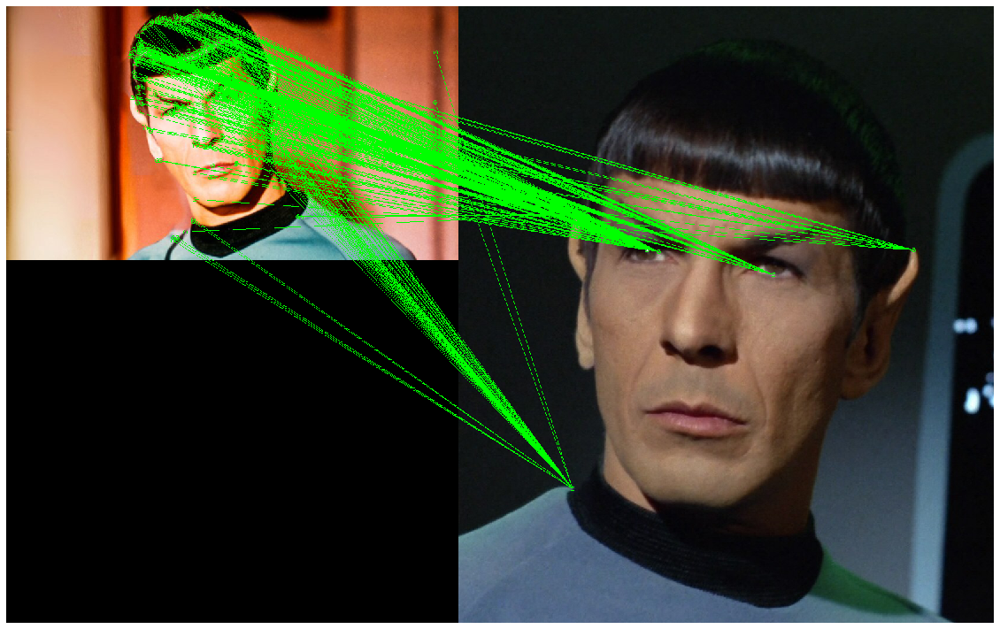

sift


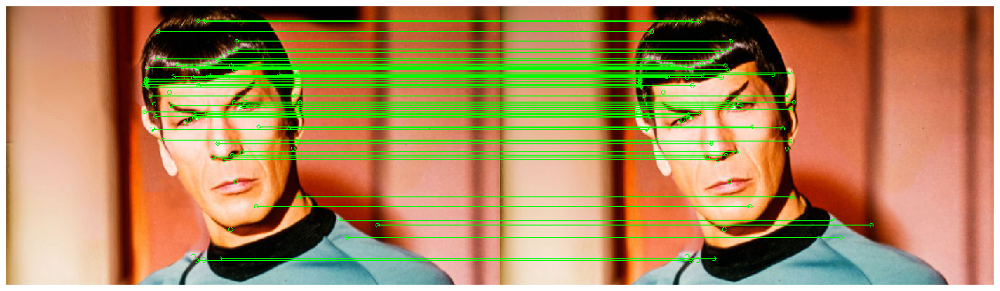

sift


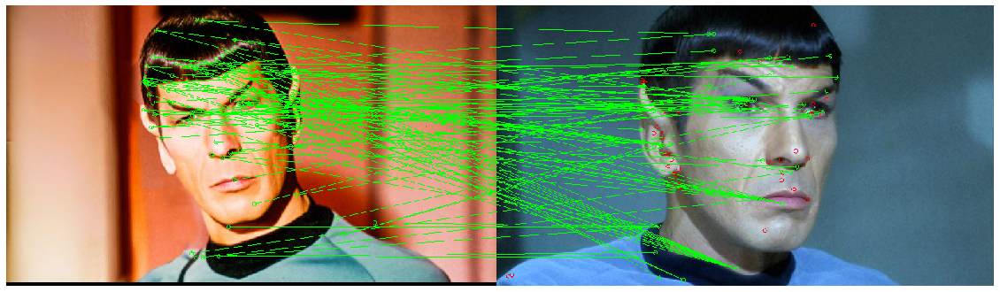

sift


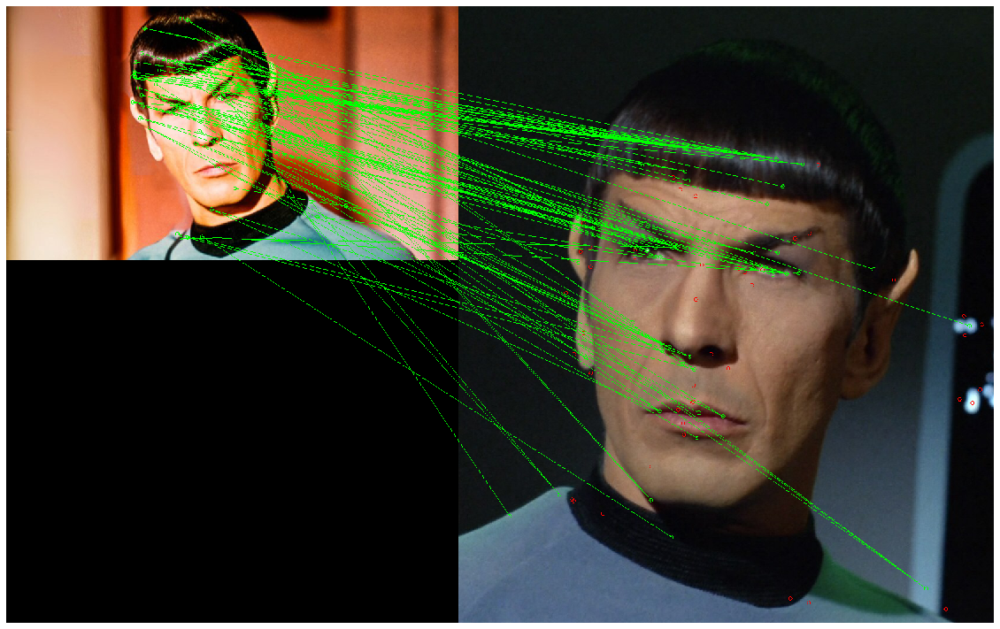

In [36]:
for detector, t_pattern, t_img in [(DETECTOR_METHOD_HARRIS, 100, 100), (DETECTOR_METHOD_FAST, 30, 30), (DETECTOR_METHOD_SIFT, 100, 100)]:
    for img in ["images/spock1.jpg", "images/spock2.jpg", "images/spock3.jpg"]:
        print(detector)
        pattern, pattern_desc = get_image_description(image.load_img("images/spock1.jpg"), t_pattern, detector=detector, drawDebug=False)
        pic, pic_desc = get_image_description(image.load_img(img), t_img, detector=detector)
        matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True)
        plt.show()